# Mask R-CNN Image Segmentation Demo
This Colab enables you to use a Mask R-CNN model that was trained on Cloud TPU to perform instance segmentation on a sample input image. The resulting predictions are overlayed on the sample image as boxes, instance masks, and labels. You can also experiment with your own images by editing the input image URL.

### About Mask R-CNN
The Mask R-CNN model addresses one of the most difficult computer vision challenges: image segmentation. Image segmentation is the task of detecting and distinguishing multiple objects within a single image. In particular, Mask R-CNN performs "instance segmentation," which means that different instances of the same type of object in the input image, for example, car, should be assigned distinct labels.

# Instructions
<h3><a href="https://cloud.google.com/tpu/"><img valign="middle" src="https://raw.githubusercontent.com/GoogleCloudPlatform/tensorflow-without-a-phd/master/tensorflow-rl-pong/images/tpu-hexagon.png" width="50"></a>  &nbsp;&nbsp;Use a free Cloud TPU</h3>
 
   1. On the main menu, click Runtime and select **Change runtime type**. Set "TPU" as the hardware accelerator.
   2. Click Runtime again and select **Runtime > Run All**. You can also run the cells manually with Shift-ENTER.

# Connect to Google Drive

In [1]:
from google.colab import drive
import os

drive.mount('/content/drive')

root_dir = '/content/drive/MyDrive/fruits_veggies_detection/datasets/fruits_and_veggies_supermarket'
os.listdir(root_dir)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


['cashiers-nc-green-market-beets (1).jpeg',
 'veggies_supermarket11.jpeg',
 'veggies_supermarket12.jpeg',
 'veggies_supermarket13.jpeg',
 'veggies_supermarket14.jpeg',
 'groceries2.jpeg',
 'groceries4.jpeg',
 'groceries5.jpeg',
 'groceries7.jpeg',
 'groceries8.jpeg',
 '1000_F_240749444_qo19poF7ekFJqsXNre5uacw7jHC3Yk7E.jpg',
 'customer-pays-fruit-to-cashier-from-the-supermarket-at-the-cashier-WXWWME.jpg',
 'depositphotos_553186560-stock-photo-cashier-in-background-with-multiple.jpg',
 'ducts-scanned-by-female-cashier-serving-one-of-buyers-in-supermarket-2JCH4J9.jpg',
 'veggies_supermarket.jpg',
 'cashier-featured.jpg',
 'happy-female-cashier-scanning-grocery-items-1.jpg',
 'customer-put-vegetable-and-fruits-footage-091831187_prevstill.jpeg']

## Download the source code
Download the source code of the Mask R-CNN model.

In [2]:
!git clone https://github.com/tensorflow/tpu/

fatal: destination path 'tpu' already exists and is not an empty directory.


In [3]:
os.listdir()

['.config', 'test_results.jpg', 'tpu', 'drive', 'sample_data']

In [4]:
os.listdir('tpu')

['models', '.git', 'README.md', '.gitignore', 'LICENSE', 'benchmarks', 'tools']

In [5]:
os.listdir('tpu/models/official/mask_rcnn')

['heads.py',
 'export_saved_model.py',
 'fpn.py',
 'mask_rcnn_k8s.yaml',
 'box_utils.py',
 'dataloader.py',
 'spatial_transform_ops.py',
 'roi_ops.py',
 'training_ops.py',
 'README.md',
 'coco_utils.py',
 'mask_rcnn_model.py',
 'object_detection',
 'mask_rcnn_main.py',
 'losses.py',
 'nn_ops.py',
 'distributed_executer.py',
 'learning_rates.py',
 'anchors.py',
 'coco_metric.py',
 'postprocess_ops.py',
 'preprocess_ops.py',
 'evaluation.py',
 'resnet.py',
 'configs',
 'mask_rcnn_demo.ipynb',
 'tpu_normalization.py',
 'serving.py']

In [6]:
os.listdir('tpu/models/official/retinanet')

['__pycache__',
 'dataloader.py',
 'README.md',
 'retinanet_segmentation_model.py',
 'object_detection',
 'retinanet_main.py',
 'postprocess.py',
 'retinanet_tensorrt.py',
 'anchors.py',
 'coco_metric.py',
 'retinanet_segmentation_main.py',
 'retinanet_architecture.py',
 'evaluation.py',
 'retinanet_model.py',
 'retinanet_k8s.yaml']

## Import libraries

In [7]:
!pip install pycocotools
!pip install coco-utils

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [8]:
from tpu.models.official.retinanet import coco_metric

In [9]:
# Copyright 2017 The TensorFlow Authors. All Rights Reserved.
#
# Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
#     http://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.
# ==============================================================================

"""Utils used to manipulate tensor shapes."""

import tensorflow.compat.v1 as tf


def assert_shape_equal(shape_a, shape_b):
  """Asserts that shape_a and shape_b are equal.

  If the shapes are static, raises a ValueError when the shapes
  mismatch.

  If the shapes are dynamic, raises a tf InvalidArgumentError when the shapes
  mismatch.

  Args:
    shape_a: a list containing shape of the first tensor.
    shape_b: a list containing shape of the second tensor.

  Returns:
    Either a tf.no_op() when shapes are all static and a tf.assert_equal() op
    when the shapes are dynamic.

  Raises:
    ValueError: When shapes are both static and unequal.
  """
  if (all(isinstance(dim, int) for dim in shape_a) and
      all(isinstance(dim, int) for dim in shape_b)):
    if shape_a != shape_b:
      raise ValueError('Unequal shapes {}, {}'.format(shape_a, shape_b))
    else: return tf.no_op()
  else:
    return tf.assert_equal(shape_a, shape_b)


def combined_static_and_dynamic_shape(tensor):
  """Returns a list containing static and dynamic values for the dimensions.

  Returns a list of static and dynamic values for shape dimensions. This is
  useful to preserve static shapes when available in reshape operation.

  Args:
    tensor: A tensor of any type.

  Returns:
    A list of size tensor.shape.ndims containing integers or a scalar tensor.
  """
  static_tensor_shape = tensor.shape.as_list()
  dynamic_tensor_shape = tf.shape(tensor)
  combined_shape = []
  for index, dim in enumerate(static_tensor_shape):
    if dim is not None:
      combined_shape.append(dim)
    else:
      combined_shape.append(dynamic_tensor_shape[index])
  return combined_shape


def pad_or_clip_nd(tensor, output_shape):
  """Pad or Clip given tensor to the output shape.

  Args:
    tensor: Input tensor to pad or clip.
    output_shape: A list of integers / scalar tensors (or None for dynamic dim)
      representing the size to pad or clip each dimension of the input tensor.

  Returns:
    Input tensor padded and clipped to the output shape.
  """
  tensor_shape = tf.shape(tensor)
  clip_size = [
      tf.where(tensor_shape[i] - shape > 0, shape, -1)
      if shape is not None else -1 for i, shape in enumerate(output_shape)
  ]
  clipped_tensor = tf.slice(
      tensor,
      begin=tf.zeros(len(clip_size), dtype=tf.int32),
      size=clip_size)

  # Pad tensor if the shape of clipped tensor is smaller than the expected
  # shape.
  clipped_tensor_shape = tf.shape(clipped_tensor)
  trailing_paddings = [
      shape - clipped_tensor_shape[i] if shape is not None else 0
      for i, shape in enumerate(output_shape)
  ]
  paddings = tf.stack(
      [
          tf.zeros(len(trailing_paddings), dtype=tf.int32),
          trailing_paddings
      ],
      axis=1)
  padded_tensor = tf.pad(clipped_tensor, paddings=paddings)
  output_static_shape = [
      dim if not isinstance(dim, tf.Tensor) else None for dim in output_shape
  ]
  padded_tensor.set_shape(output_static_shape)
  return padded_tensor


In [10]:
from IPython import display
from PIL import Image
import numpy as np
#%tensorflow_version 1.x
import tensorflow as tf
import sys
sys.path.insert(0, 'tpu/models/official')
sys.path.insert(0, 'tpu/models/official/mask_rcnn')
# import coco_metric
from tpu.models.official.retinanet import coco_metric
# from mask_rcnn.object_detection import visualization_utils
from tpu.models.official.mask_rcnn.object_detection import visualization_utils

## Load the COCO index mapping
This Colab uses a pretrained checkpoint of the Mask R-CNN model that is trained using the COCO dataset. Here is the mapping between the indices that the model predicts and the categories in text.

In [11]:
ID_MAPPING = {
    1: 'person',
    2: 'bicycle',
    3: 'car',
    4: 'motorcycle',
    5: 'airplane',
    6: 'bus',
    7: 'train',
    8: 'truck',
    9: 'boat',
    10: 'traffic light',
    11: 'fire hydrant',
    13: 'stop sign',
    14: 'parking meter',
    15: 'bench',
    16: 'bird',
    17: 'cat',
    18: 'dog',
    19: 'horse',
    20: 'sheep',
    21: 'cow',
    22: 'elephant',
    23: 'bear',
    24: 'zebra',
    25: 'giraffe',
    27: 'backpack',
    28: 'umbrella',
    31: 'handbag',
    32: 'tie',
    33: 'suitcase',
    34: 'frisbee',
    35: 'skis',
    36: 'snowboard',
    37: 'sports ball',
    38: 'kite',
    39: 'baseball bat',
    40: 'baseball glove',
    41: 'skateboard',
    42: 'surfboard',
    43: 'tennis racket',
    44: 'bottle',
    46: 'wine glass',
    47: 'cup',
    48: 'fork',
    49: 'knife',
    50: 'spoon',
    51: 'bowl',
    52: 'banana', # important
    53: 'apple', # important
    54: 'sandwich',
    55: 'orange', # important
    56: 'broccoli', # important
    57: 'carrot', # important
    58: 'hot dog',
    59: 'pizza',
    60: 'donut',
    61: 'cake',
    62: 'chair',
    63: 'couch',
    64: 'potted plant',
    65: 'bed',
    67: 'dining table',
    70: 'toilet',
    72: 'tv',
    73: 'laptop',
    74: 'mouse',
    75: 'remote',
    76: 'keyboard',
    77: 'cell phone',
    78: 'microwave',
    79: 'oven',
    80: 'toaster',
    81: 'sink',
    82: 'refrigerator',
    84: 'book',
    85: 'clock',
    86: 'vase',
    87: 'scissors',
    88: 'teddy bear',
    89: 'hair drier',
    90: 'toothbrush',
}
category_index = {k: {'id': k, 'name': ID_MAPPING[k]} for k in ID_MAPPING}

## Load an image
Now, you can load an image. Use either the sample image included here, or update the field with an image of your choice.

In [12]:
os.listdir(root_dir)

['cashiers-nc-green-market-beets (1).jpeg',
 'veggies_supermarket11.jpeg',
 'veggies_supermarket12.jpeg',
 'veggies_supermarket13.jpeg',
 'veggies_supermarket14.jpeg',
 'groceries2.jpeg',
 'groceries4.jpeg',
 'groceries5.jpeg',
 'groceries7.jpeg',
 'groceries8.jpeg',
 '1000_F_240749444_qo19poF7ekFJqsXNre5uacw7jHC3Yk7E.jpg',
 'customer-pays-fruit-to-cashier-from-the-supermarket-at-the-cashier-WXWWME.jpg',
 'depositphotos_553186560-stock-photo-cashier-in-background-with-multiple.jpg',
 'ducts-scanned-by-female-cashier-serving-one-of-buyers-in-supermarket-2JCH4J9.jpg',
 'veggies_supermarket.jpg',
 'cashier-featured.jpg',
 'happy-female-cashier-scanning-grocery-items-1.jpg',
 'customer-put-vegetable-and-fruits-footage-091831187_prevstill.jpeg']

In [13]:
import cv2
from matplotlib import pyplot as plt
  
def plot_image(img_path):
  img = cv2.imread(img_path)

  # img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
  # Creates the environment 
  # of the picture and shows it
  # plt.subplot(1, 1, 1)
  plt.imshow(img_rgb)
  # plt.imshow(img)
  plt.show()

# selected_image = 'depositphotos_553186560-stock-photo-cashier-in-background-with-multiple.jpg'
selected_image = 'cashier-featured.jpg'
image_path = os.path.join(root_dir,
                        selected_image)
plot_image(image_path)

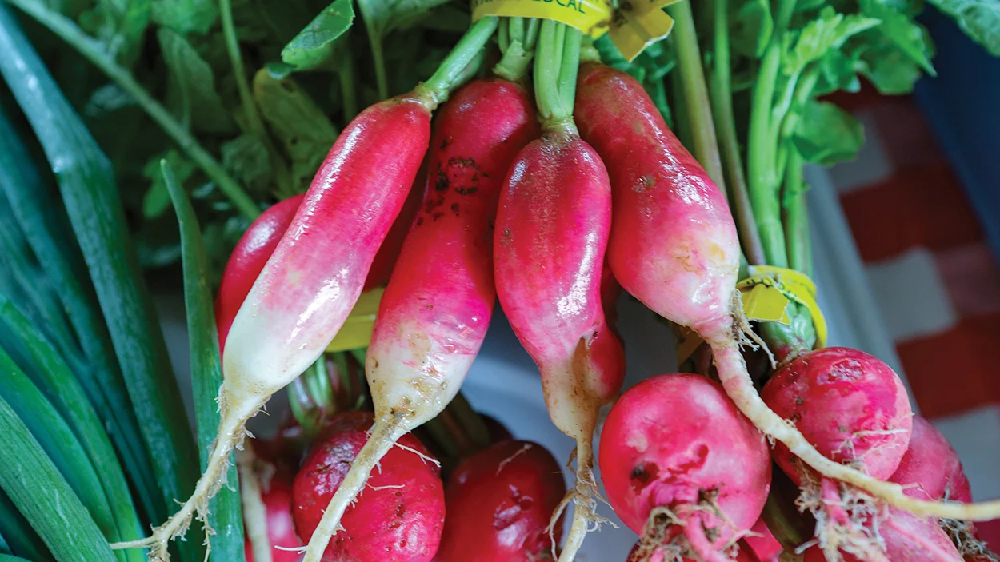

In [14]:
selected_image = os.listdir(root_dir)[0]
image_path = os.path.join(root_dir,
                        selected_image)

with open(image_path, 'rb') as f:
  np_image_string = np.array([f.read()])
  
image = Image.open(image_path)
width, height = image.size
np_image = np.array(image.getdata()).reshape(height, width, 3).astype(np.uint8)

display.display(display.Image(image_path, width=1024))

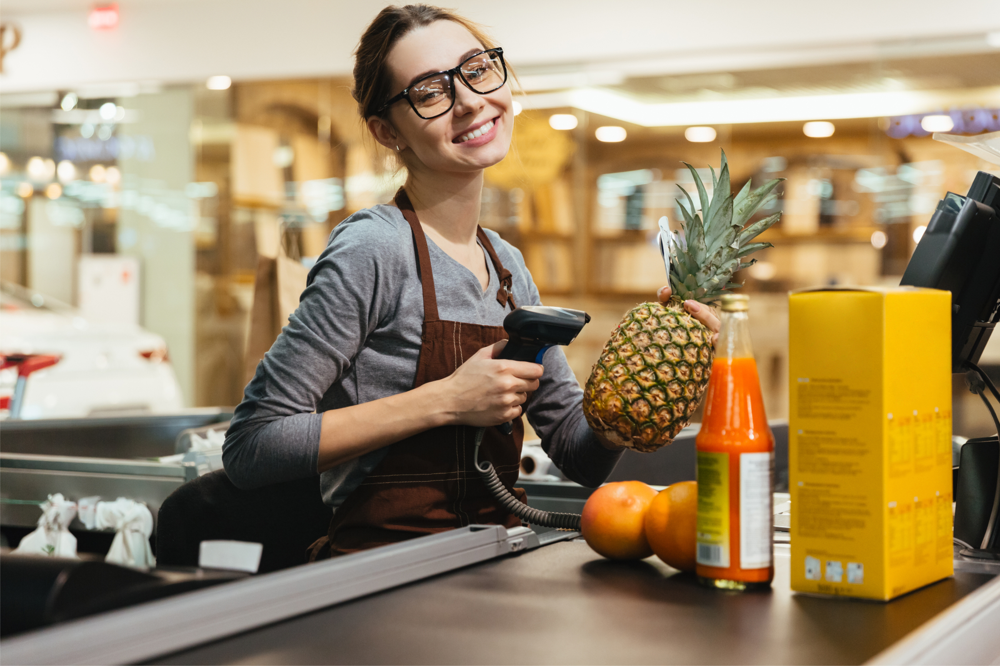

In [15]:
selected_image = os.listdir(root_dir)[-2]
image_path = os.path.join(root_dir,
                        selected_image)

with open(image_path, 'rb') as f:
  np_image_string = np.array([f.read()])
  
image = Image.open(image_path)
width, height = image.size
np_image = np.array(image.getdata()).reshape(height, width, 3).astype(np.uint8)

display.display(display.Image(image_path, width=1024))

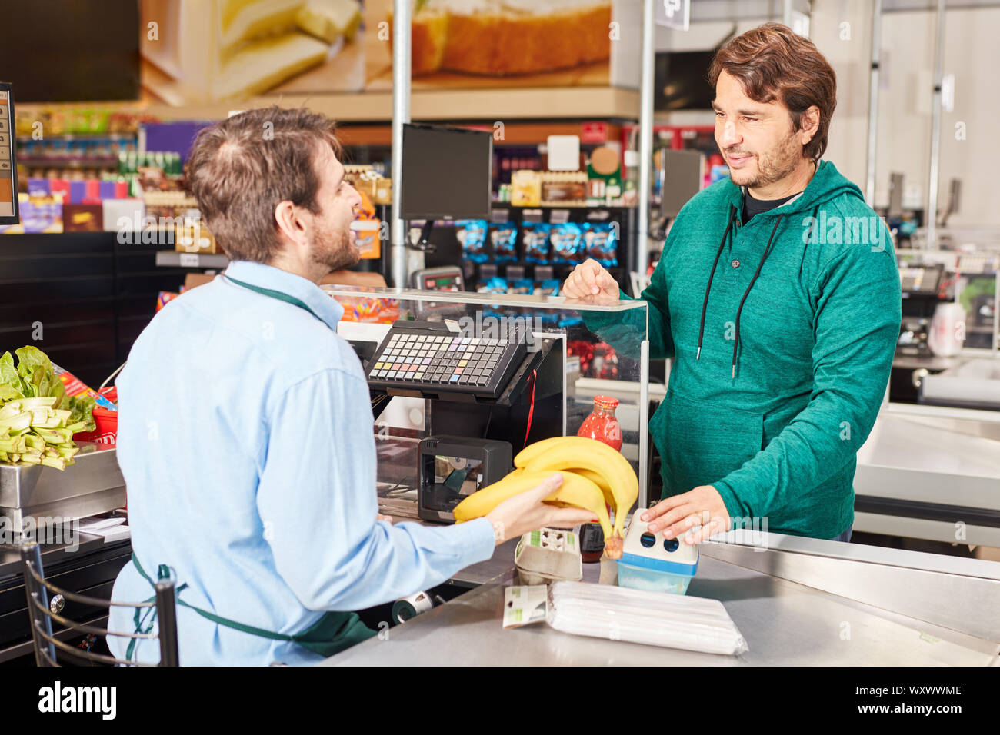

In [16]:
# !wget https://upload.wikimedia.org/wikipedia/commons/thumb/0/08/Kitano_Street_Kobe01s5s4110.jpg/2560px-Kitano_Street_Kobe01s5s4110.jpg -O test.jpg
# image_path = 'test.jpg'

image_path = os.path.join(root_dir,
                          os.listdir(root_dir)[11]
)
with open(image_path, 'rb') as f:
  np_image_string = np.array([f.read()])
  
image = Image.open(image_path)
width, height = image.size
np_image = np.array(image.getdata()).reshape(height, width, 3).astype(np.uint8)

display.display(display.Image(image_path, width=1024))

## Create a Tensorflow session
Now let us create a Tensorflow session to run the inference. You can either connect to a TPU or a normal CPU backend.

In [17]:
import tensorflow.compat.v1 as tf
tf.disable_v2_behavior()

Instructions for updating:
non-resource variables are not supported in the long term


In [18]:
use_tpu = False #@param {type:"boolean"}
if use_tpu:
  import os
  import pprint

  assert 'COLAB_TPU_ADDR' in os.environ, 'ERROR: Not connected to a TPU runtime; please see the first cell in this notebook for instructions!'
  TPU_ADDRESS = 'grpc://' + os.environ['COLAB_TPU_ADDR']
  print('TPU address is', TPU_ADDRESS)

  session = tf.Session(TPU_ADDRESS, graph=tf.Graph())
  print('TPU devices:')
  pprint.pprint(session.list_devices())
else:
  session = tf.Session(graph=tf.Graph())

# Load the pretrained model
Loading the COCO pretrained saved model from the public GCS bucket. 

In [19]:
saved_model_dir = 'gs://cloud-tpu-checkpoints/mask-rcnn/1555659850' #@param {type:"string"}
_ = tf.saved_model.loader.load(session, ['serve'], saved_model_dir)

Instructions for updating:
This function will only be available through the v1 compatibility library as tf.compat.v1.saved_model.loader.load or tf.compat.v1.saved_model.load. There will be a new function for importing SavedModels in Tensorflow 2.0.


# debugging missing function generate_segmentation_from_masks

In [20]:
# Copyright 2018 The TensorFlow Authors. All Rights Reserved.
#
# Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
#     http://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.
# ==============================================================================
"""COCO-style evaluation metrics.
Implements the interface of COCO API and metric_fn in tf.TPUEstimator.
COCO API: github.com/cocodataset/cocoapi/
"""
from __future__ import absolute_import
from __future__ import division
from __future__ import print_function
import atexit
import copy
import tempfile
import numpy as np
from pycocotools.coco import COCO
from pycocotools.cocoeval import COCOeval
import pycocotools.mask as maskUtils
import tensorflow.compat.v1 as tf
import cv2


class MaskCOCO(COCO):
  """COCO object for mask evaluation.
  """

  def reset(self, dataset):
    """Reset the dataset and groundtruth data index in this object.
    Args:
      dataset: dict of groundtruth data. It should has similar structure as the
        COCO groundtruth JSON file. Must contains three keys: {'images',
          'annotations', 'categories'}.
        'images': list of image information dictionary. Required keys: 'id',
          'width' and 'height'.
        'annotations': list of dict. Bounding boxes and segmentations related
          information. Required keys: {'id', 'image_id', 'category_id', 'bbox',
            'iscrowd', 'area', 'segmentation'}.
        'categories': list of dict of the category information.
          Required key: 'id'.
        Refer to http://cocodataset.org/#format-data for more details.
    Raises:
      AttributeError: If the dataset is empty or not a dict.
    """
    assert dataset, 'Groundtruth should not be empty.'
    assert isinstance(dataset,
                      dict), 'annotation file format {} not supported'.format(
                          type(dataset))
    self.anns, self.cats, self.imgs = dict(), dict(), dict()
    self.dataset = copy.deepcopy(dataset)
    self.createIndex()

  def loadRes(self, detection_results, include_mask, is_image_mask=False):
    """Load result file and return a result api object.
    Args:
      detection_results: a dictionary containing predictions results.
      include_mask: a boolean, whether to include mask in detection results.
      is_image_mask: a boolean, where the predict mask is a whole image mask.
    Returns:
      res: result MaskCOCO api object
    """
    res = MaskCOCO()
    res.dataset['images'] = [img for img in self.dataset['images']]
    print('Loading and preparing results...')
    predictions = self.load_predictions(
        detection_results,
        include_mask=include_mask,
        is_image_mask=is_image_mask)
    assert isinstance(predictions, list), 'results in not an array of objects'
    if predictions:
      image_ids = [pred['image_id'] for pred in predictions]
      assert set(image_ids) == (set(image_ids) & set(self.getImgIds())), \
             'Results do not correspond to current coco set'

      if (predictions and 'bbox' in predictions[0] and predictions[0]['bbox']):
        res.dataset['categories'] = copy.deepcopy(self.dataset['categories'])
        for idx, pred in enumerate(predictions):
          bb = pred['bbox']
          x1, x2, y1, y2 = [bb[0], bb[0] + bb[2], bb[1], bb[1] + bb[3]]
          if 'segmentation' not in pred:
            pred['segmentation'] = [[x1, y1, x1, y2, x2, y2, x2, y1]]
          pred['area'] = bb[2] * bb[3]
          pred['id'] = idx + 1
          pred['iscrowd'] = 0
      elif 'segmentation' in predictions[0]:
        res.dataset['categories'] = copy.deepcopy(self.dataset['categories'])
        for idx, pred in enumerate(predictions):
          # now only support compressed RLE format as segmentation results
          pred['area'] = maskUtils.area(pred['segmentation'])
          if 'bbox' not in pred:
            pred['bbox'] = maskUtils.toBbox(pred['segmentation'])
          pred['id'] = idx + 1
          pred['iscrowd'] = 0

      res.dataset['annotations'] = predictions

    res.createIndex()
    return res

  def load_predictions(self,
                       detection_results,
                       include_mask,
                       is_image_mask=False):
    """Create prediction dictionary list from detection and mask results.
    Args:
      detection_results: a dictionary containing numpy arrays which corresponds
        to prediction results.
      include_mask: a boolean, whether to include mask in detection results.
      is_image_mask: a boolean, where the predict mask is a whole image mask.
    Returns:
      a list of dictionary including different prediction results from the model
        in numpy form.
    """
    predictions = []
    num_detections = detection_results['detection_scores'].size
    current_index = 0
    for i, image_id in enumerate(detection_results['source_id']):

      if include_mask:
        box_coorindates_in_image = detection_results['detection_boxes'][i]
        segments = generate_segmentation_from_masks(
            detection_results['detection_masks'][i],
            box_coorindates_in_image,
            int(detection_results['image_info'][i][3]),
            int(detection_results['image_info'][i][4]),
            is_image_mask=is_image_mask)

        # Convert the mask to uint8 and then to fortranarray for RLE encoder.
        encoded_masks = [
            maskUtils.encode(np.asfortranarray(instance_mask.astype(np.uint8)))
            for instance_mask in segments
        ]

      for box_index in range(int(detection_results['num_detections'][i])):
        if current_index % 1000000 == 0:
          print('{}/{}'.format(current_index, num_detections))
        current_index += 1

        prediction = {
            'image_id': int(image_id),
            'bbox': detection_results['detection_boxes'][i][box_index].tolist(),
            'score': detection_results['detection_scores'][i][box_index],
            'category_id': int(
                detection_results['detection_classes'][i][box_index]),
        }

        if include_mask:
          prediction['segmentation'] = encoded_masks[box_index]

        predictions.append(prediction)

    return predictions


def generate_segmentation_from_masks(masks,
                                     detected_boxes,
                                     image_height,
                                     image_width,
                                     is_image_mask=False):
  """Generates segmentation result from instance masks.
  Args:
    masks: a numpy array of shape [N, mask_height, mask_width] representing the
      instance masks w.r.t. the `detected_boxes`.
    detected_boxes: a numpy array of shape [N, 4] representing the reference
      bounding boxes.
    image_height: an integer representing the height of the image.
    image_width: an integer representing the width of the image.
    is_image_mask: bool. True: input masks are whole-image masks. False: input
      masks are bounding-box level masks.
  Returns:
    segms: a numpy array of shape [N, image_height, image_width] representing
      the instance masks *pasted* on the image canvas.
  """

  def expand_boxes(boxes, scale):
    """Expands an array of boxes by a given scale."""
    # Reference: https://github.com/facebookresearch/Detectron/blob/master/detectron/utils/boxes.py#L227  # pylint: disable=line-too-long
    # The `boxes` in the reference implementation is in [x1, y1, x2, y2] form,
    # whereas `boxes` here is in [x1, y1, w, h] form
    w_half = boxes[:, 2] * .5
    h_half = boxes[:, 3] * .5
    x_c = boxes[:, 0] + w_half
    y_c = boxes[:, 1] + h_half

    w_half *= scale
    h_half *= scale

    boxes_exp = np.zeros(boxes.shape)
    boxes_exp[:, 0] = x_c - w_half
    boxes_exp[:, 2] = x_c + w_half
    boxes_exp[:, 1] = y_c - h_half
    boxes_exp[:, 3] = y_c + h_half

    return boxes_exp

  # Reference: https://github.com/facebookresearch/Detectron/blob/master/detectron/core/test.py#L812  # pylint: disable=line-too-long
  # To work around an issue with cv2.resize (it seems to automatically pad
  # with repeated border values), we manually zero-pad the masks by 1 pixel
  # prior to resizing back to the original image resolution. This prevents
  # "top hat" artifacts. We therefore need to expand the reference boxes by an
  # appropriate factor.
  _, mask_height, mask_width = masks.shape
  scale = max((mask_width + 2.0) / mask_width,
              (mask_height + 2.0) / mask_height)

  ref_boxes = expand_boxes(detected_boxes, scale)
  ref_boxes = ref_boxes.astype(np.int32)
  padded_mask = np.zeros((mask_height + 2, mask_width + 2), dtype=np.float32)
  segms = []
  for mask_ind, mask in enumerate(masks):
    im_mask = np.zeros((image_height, image_width), dtype=np.uint8)
    if is_image_mask:
      # Process whole-image masks.
      im_mask[:, :] = mask[:, :]
    else:
      # Process mask inside bounding boxes.
      padded_mask[1:-1, 1:-1] = mask[:, :]

      ref_box = ref_boxes[mask_ind, :]
      w = ref_box[2] - ref_box[0] + 1
      h = ref_box[3] - ref_box[1] + 1
      w = np.maximum(w, 1)
      h = np.maximum(h, 1)

      mask = cv2.resize(padded_mask, (w, h))
      mask = np.array(mask > 0.5, dtype=np.uint8)

      x_0 = max(ref_box[0], 0)
      x_1 = min(ref_box[2] + 1, image_width)
      y_0 = max(ref_box[1], 0)
      y_1 = min(ref_box[3] + 1, image_height)

      im_mask[y_0:y_1, x_0:x_1] = mask[(y_0 - ref_box[1]):(y_1 - ref_box[1]), (
          x_0 - ref_box[0]):(x_1 - ref_box[0])]
    segms.append(im_mask)

  segms = np.array(segms)
  assert masks.shape[0] == segms.shape[0]
  return segms


class EvaluationMetric(object):
  """COCO evaluation metric class."""

  def __init__(self, filename, include_mask):
    """Constructs COCO evaluation class.
    The class provides the interface to metrics_fn in TPUEstimator. The
    _evaluate() loads a JSON file in COCO annotation format as the
    groundtruths and runs COCO evaluation.
    Args:
      filename: Ground truth JSON file name. If filename is None, use
        groundtruth data passed from the dataloader for evaluation.
      include_mask: boolean to indicate whether or not to include mask eval.
    """
    if filename:
      if filename.startswith('gs://'):
        _, local_val_json = tempfile.mkstemp(suffix='.json')
        tf.gfile.Remove(local_val_json)

        tf.gfile.Copy(filename, local_val_json)
        atexit.register(tf.gfile.Remove, local_val_json)
      else:
        local_val_json = filename
      self.coco_gt = MaskCOCO(local_val_json)
    self.filename = filename
    self.metric_names = ['AP', 'AP50', 'AP75', 'APs', 'APm', 'APl', 'ARmax1',
                         'ARmax10', 'ARmax100', 'ARs', 'ARm', 'ARl']
    self._include_mask = include_mask
    if self._include_mask:
      mask_metric_names = ['mask_' + x for x in self.metric_names]
      self.metric_names.extend(mask_metric_names)

    self._reset()

  def _reset(self):
    """Reset COCO API object."""
    if self.filename is None and not hasattr(self, 'coco_gt'):
      self.coco_gt = MaskCOCO()

  def predict_metric_fn(self,
                        predictions,
                        is_predict_image_mask=False,
                        groundtruth_data=None):
    """Generates COCO metrics."""
    image_ids = list(set(predictions['source_id']))
    if groundtruth_data is not None:
      self.coco_gt.reset(groundtruth_data)
    coco_dt = self.coco_gt.loadRes(
        predictions, self._include_mask, is_image_mask=is_predict_image_mask)
    coco_eval = COCOeval(self.coco_gt, coco_dt, iouType='bbox')
    coco_eval.params.imgIds = image_ids
    coco_eval.evaluate()
    coco_eval.accumulate()
    coco_eval.summarize()
    coco_metrics = coco_eval.stats

    if self._include_mask:
      # Create another object for instance segmentation metric evaluation.
      mcoco_eval = COCOeval(self.coco_gt, coco_dt, iouType='segm')
      mcoco_eval.params.imgIds = image_ids
      mcoco_eval.evaluate()
      mcoco_eval.accumulate()
      mcoco_eval.summarize()
      mask_coco_metrics = mcoco_eval.stats

    if self._include_mask:
      metrics = np.hstack((coco_metrics, mask_coco_metrics))
    else:
      metrics = coco_metrics

    # clean up after evaluation is done.
    self._reset()
    metrics = metrics.astype(np.float32)

    metrics_dict = {}
    for i, name in enumerate(self.metric_names):
      metrics_dict[name] = metrics[i]
    return metrics_dict

## Perform instance segmentation and retrieve the predictions
Now let's run the inference and process the predictions from the model.


In [21]:
num_detections, detection_boxes, detection_classes, detection_scores, detection_masks, image_info = session.run(
    ['NumDetections:0', 
     'DetectionBoxes:0', 
     'DetectionClasses:0', 
     'DetectionScores:0', 
     'DetectionMasks:0', 
     'ImageInfo:0'],
    feed_dict={'Placeholder:0': np_image_string})

num_detections = np.squeeze(num_detections.astype(np.int32), axis=(0,))
detection_boxes = np.squeeze(detection_boxes * image_info[0, 2], axis=(0,))[0:num_detections]
detection_scores = np.squeeze(detection_scores, axis=(0,))[0:num_detections]
detection_classes = np.squeeze(detection_classes.astype(np.int32), axis=(0,))[0:num_detections]
instance_masks = np.squeeze(detection_masks, axis=(0,))[0:num_detections]
ymin, xmin, ymax, xmax = np.split(detection_boxes, 4, axis=-1)
processed_boxes = np.concatenate([xmin, ymin, xmax - xmin, ymax - ymin], axis=-1)
# segmentations = coco_metric.generate_segmentation_from_masks(instance_masks, processed_boxes, height, width)
segmentations = generate_segmentation_from_masks(instance_masks, processed_boxes, height, width)

## Visualize the detection results
Time to check out the result!

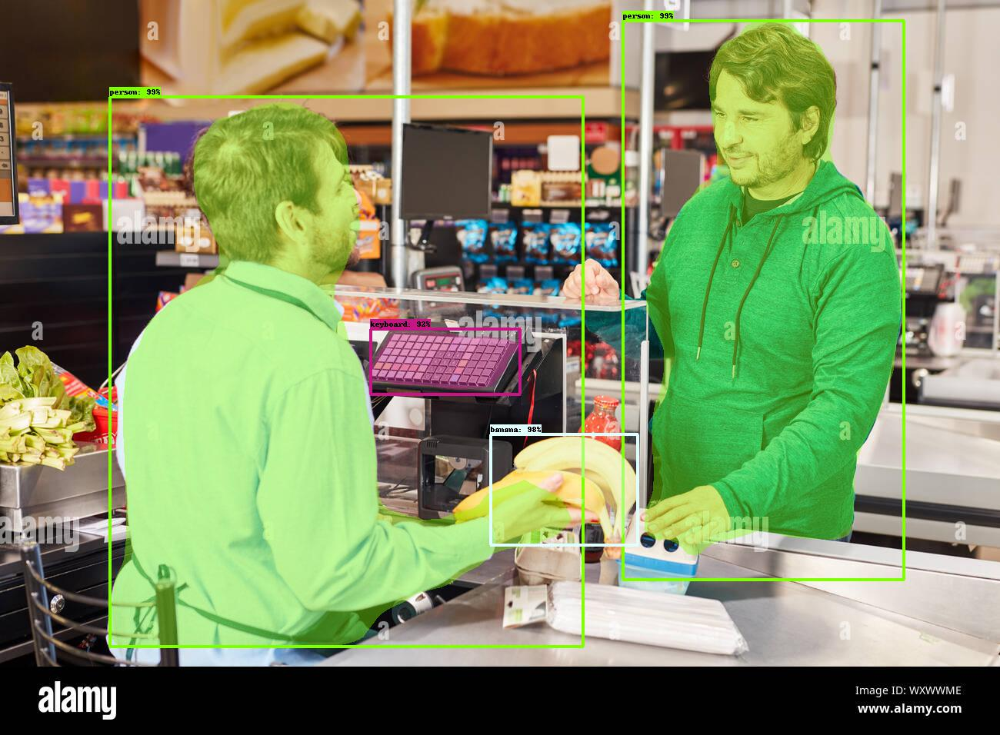

In [22]:
max_boxes_to_draw = 4   #@param {type:"integer"}
min_score_thresh = 0.64    #@param {type:"slider", min:0, max:1, step:0.01}

image_with_detections = visualization_utils.visualize_boxes_and_labels_on_image_array(
    np_image,
    detection_boxes,
    detection_classes,
    detection_scores,
    category_index,
    instance_masks=segmentations,
    use_normalized_coordinates=False,
    max_boxes_to_draw=max_boxes_to_draw,
    min_score_thresh=min_score_thresh)
output_image_path = 'test_results.jpg'
Image.fromarray(image_with_detections.astype(np.uint8)).save(output_image_path)
display.display(display.Image(output_image_path, width=1024))

In [23]:
def detect_objects_in_images(image_path,
                             width_img = 1024,
                             plot_original_image = False
                             ):
  with open(image_path, 'rb') as f:
    np_image_string = np.array([f.read()])
    
  image = Image.open(image_path)
  width, height = image.size
  np_image = np.array(image.getdata()).reshape(height, width, 3).astype(np.uint8)

  if plot_original_image:
    display.display(display.Image(image_path, width=width_img))

  # setting detection parameters
  num_detections, detection_boxes, detection_classes, detection_scores, detection_masks, image_info = session.run(
      ['NumDetections:0', 
      'DetectionBoxes:0', 
      'DetectionClasses:0', 
      'DetectionScores:0', 
      'DetectionMasks:0', 
      'ImageInfo:0'],
      feed_dict={'Placeholder:0': np_image_string})

  num_detections = np.squeeze(num_detections.astype(np.int32), axis=(0,))
  detection_boxes = np.squeeze(detection_boxes * image_info[0, 2], axis=(0,))[0:num_detections]
  detection_scores = np.squeeze(detection_scores, axis=(0,))[0:num_detections]
  detection_classes = np.squeeze(detection_classes.astype(np.int32), axis=(0,))[0:num_detections]
  instance_masks = np.squeeze(detection_masks, axis=(0,))[0:num_detections]
  ymin, xmin, ymax, xmax = np.split(detection_boxes, 4, axis=-1)
  processed_boxes = np.concatenate([xmin, ymin, xmax - xmin, ymax - ymin], axis=-1)
  # segmentations = coco_metric.generate_segmentation_from_masks(instance_masks, processed_boxes, height, width)
  segmentations = generate_segmentation_from_masks(instance_masks, processed_boxes, height, width)


  # performing inference

  max_boxes_to_draw = 10  
  min_score_thresh = 0.7  

  image_with_detections = visualization_utils.visualize_boxes_and_labels_on_image_array(
      np_image,
      detection_boxes,
      detection_classes,
      detection_scores,
      category_index,
      instance_masks=segmentations,
      use_normalized_coordinates=False,
      max_boxes_to_draw=max_boxes_to_draw,
      min_score_thresh=min_score_thresh)
  output_image_path = 'test_results.jpg'
  Image.fromarray(image_with_detections.astype(np.uint8)).save(output_image_path)
  display.display(display.Image(output_image_path, width=width_img))

i: 0, img_name: cashiers-nc-green-market-beets (1).jpeg


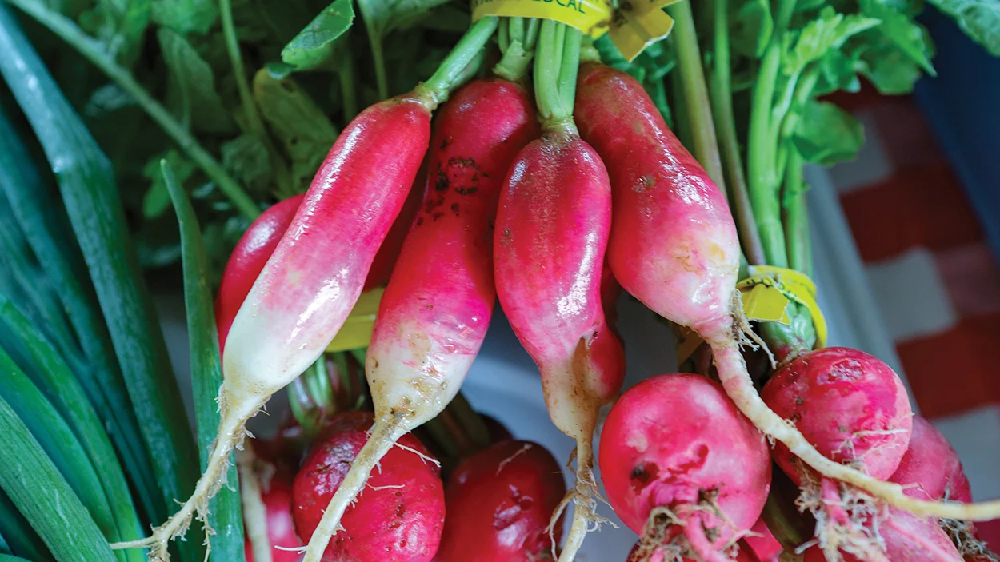

i: 1, img_name: veggies_supermarket11.jpeg


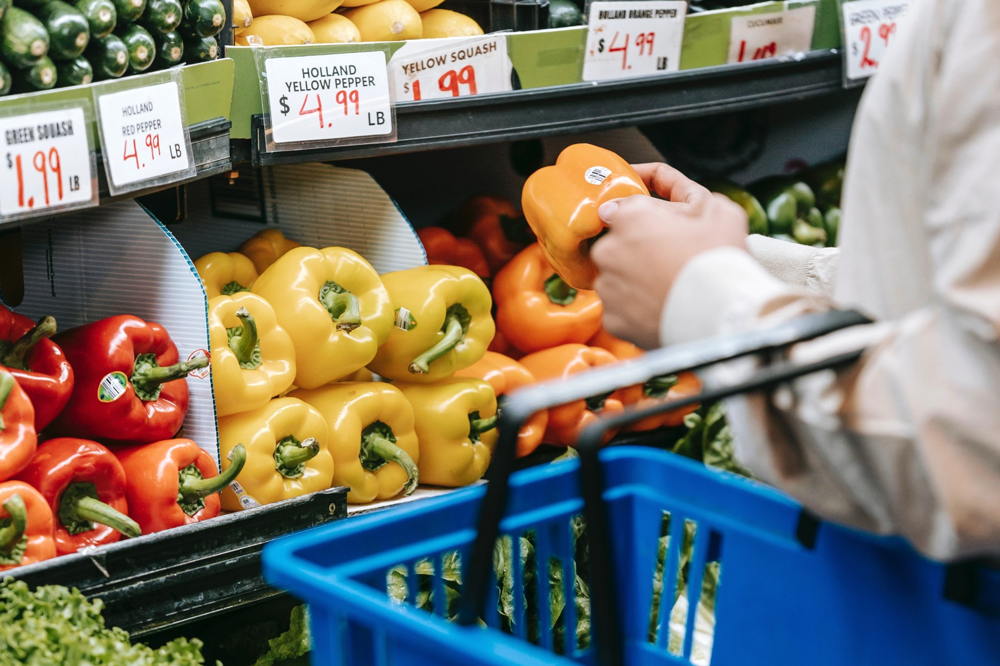

i: 2, img_name: veggies_supermarket12.jpeg


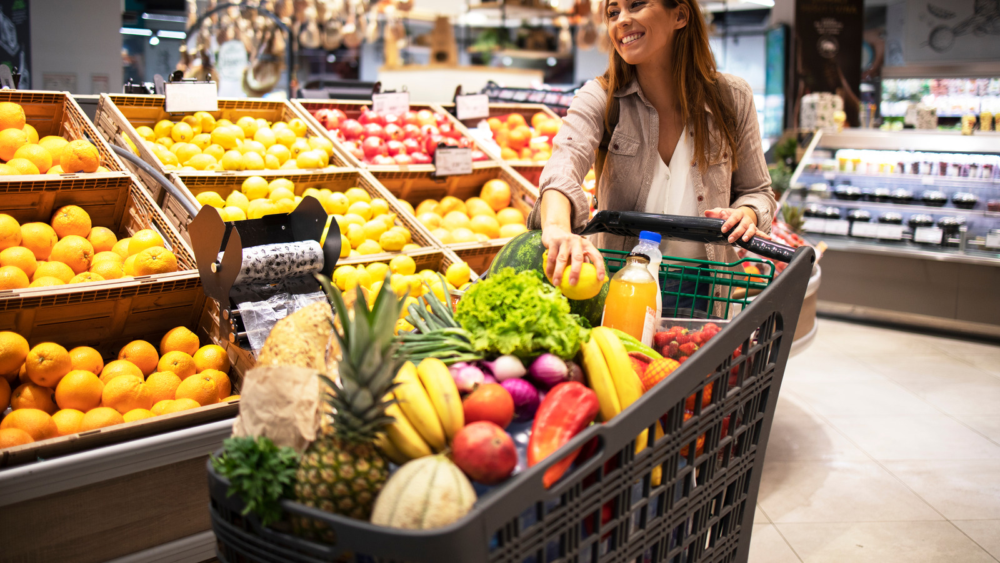

i: 3, img_name: veggies_supermarket13.jpeg


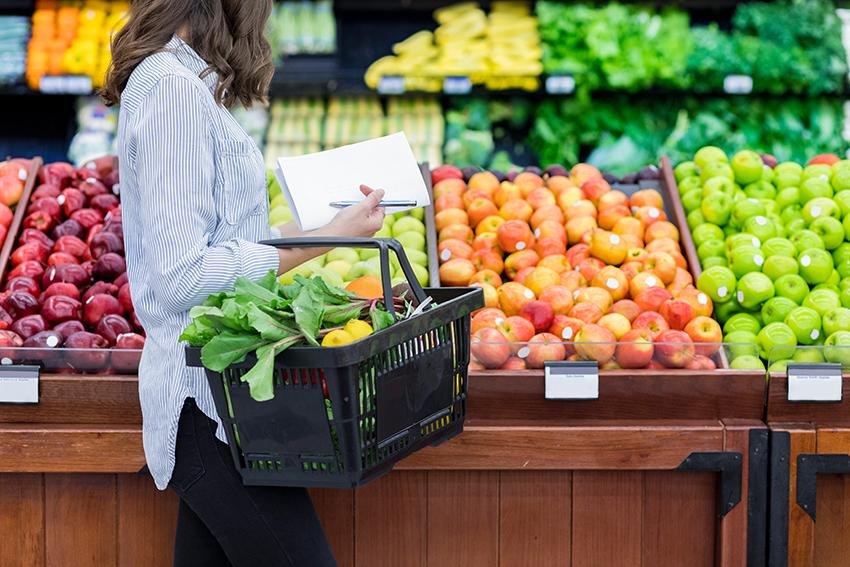

i: 4, img_name: veggies_supermarket14.jpeg


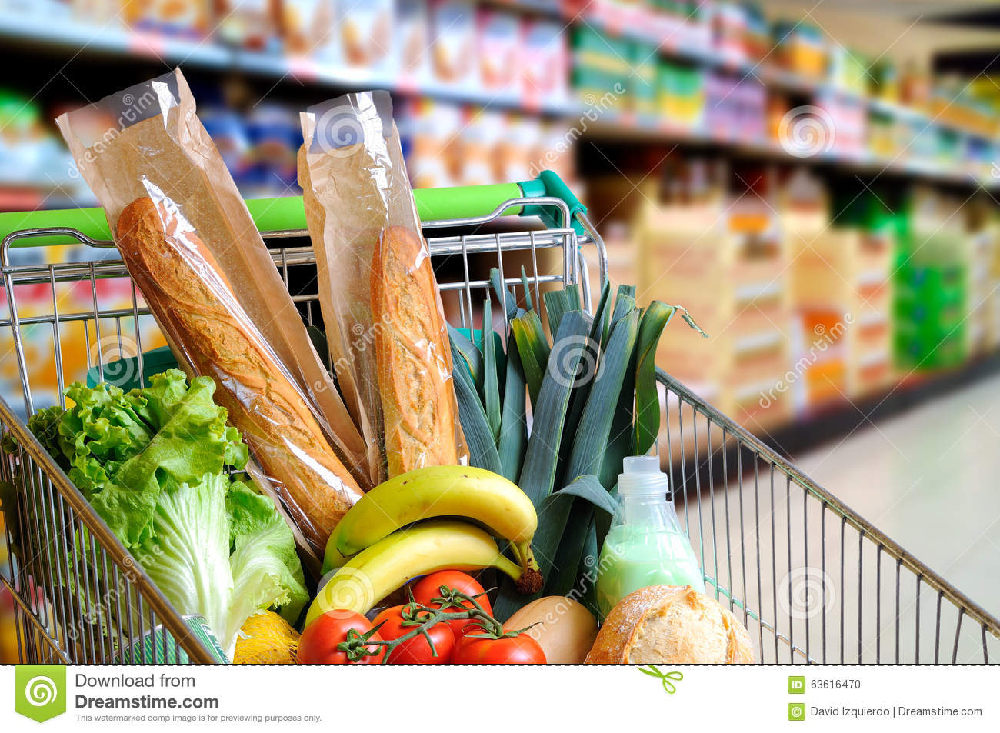

i: 5, img_name: groceries2.jpeg


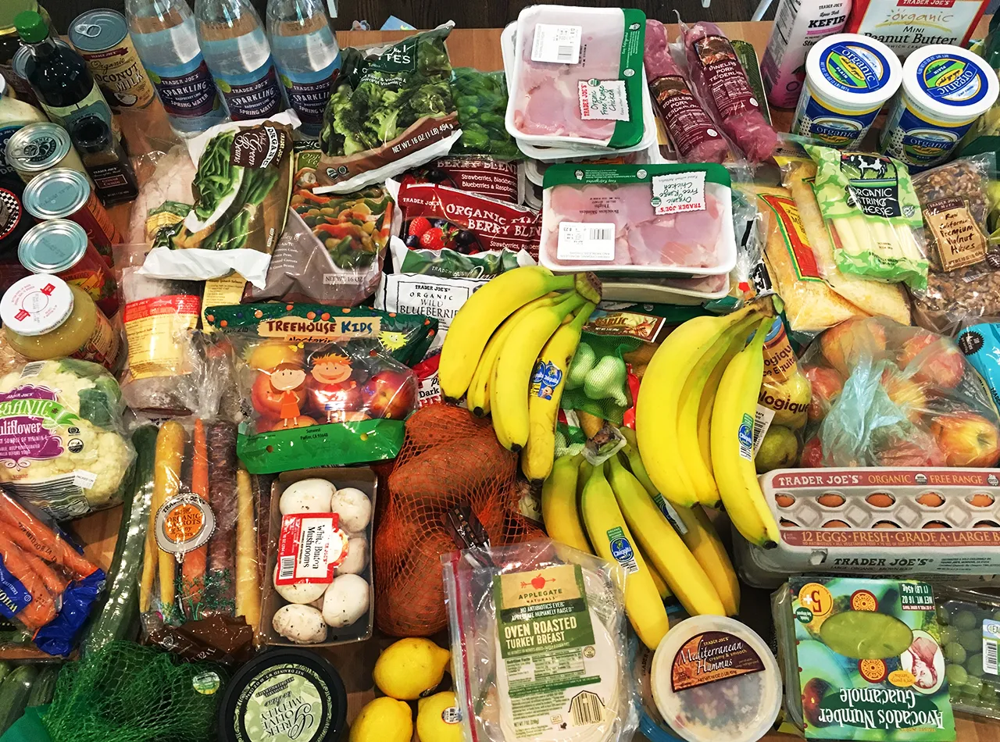

i: 6, img_name: groceries4.jpeg


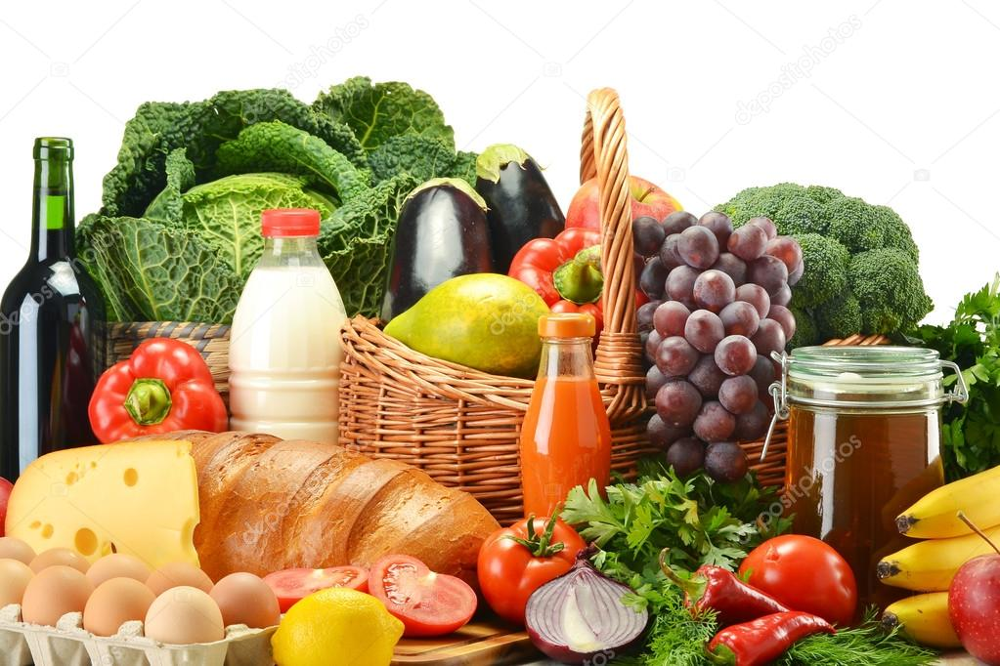

i: 7, img_name: groceries5.jpeg


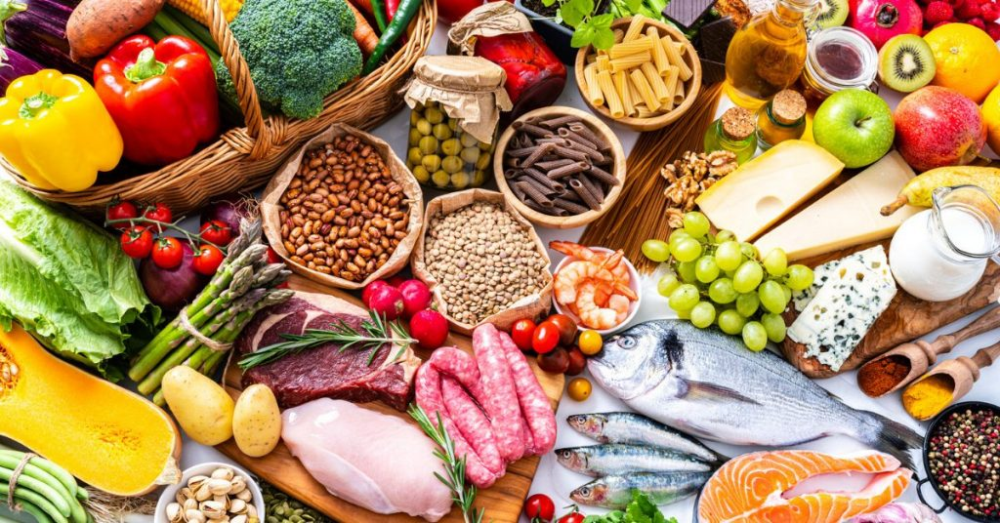

i: 8, img_name: groceries7.jpeg


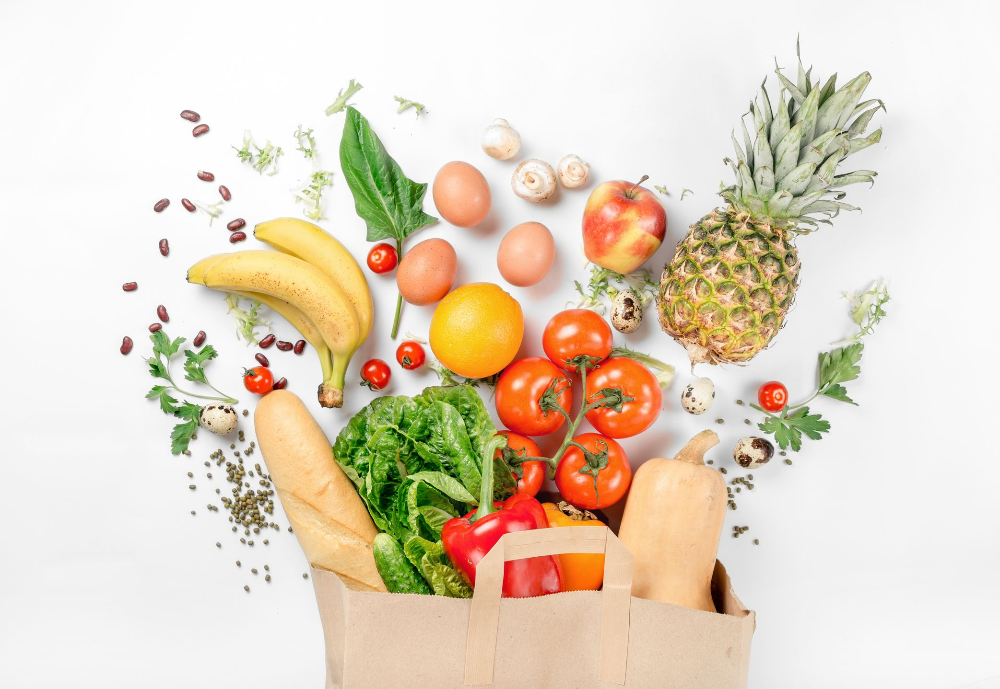

i: 9, img_name: groceries8.jpeg


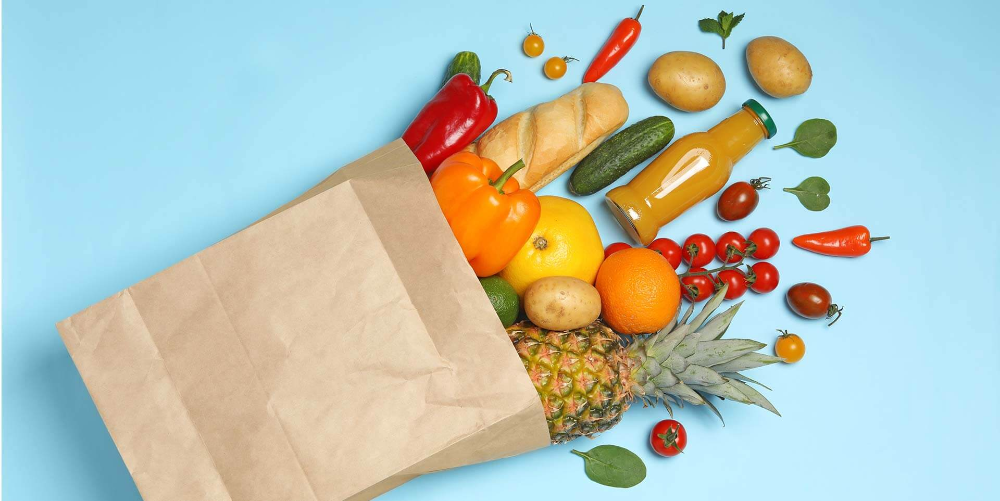

i: 10, img_name: 1000_F_240749444_qo19poF7ekFJqsXNre5uacw7jHC3Yk7E.jpg


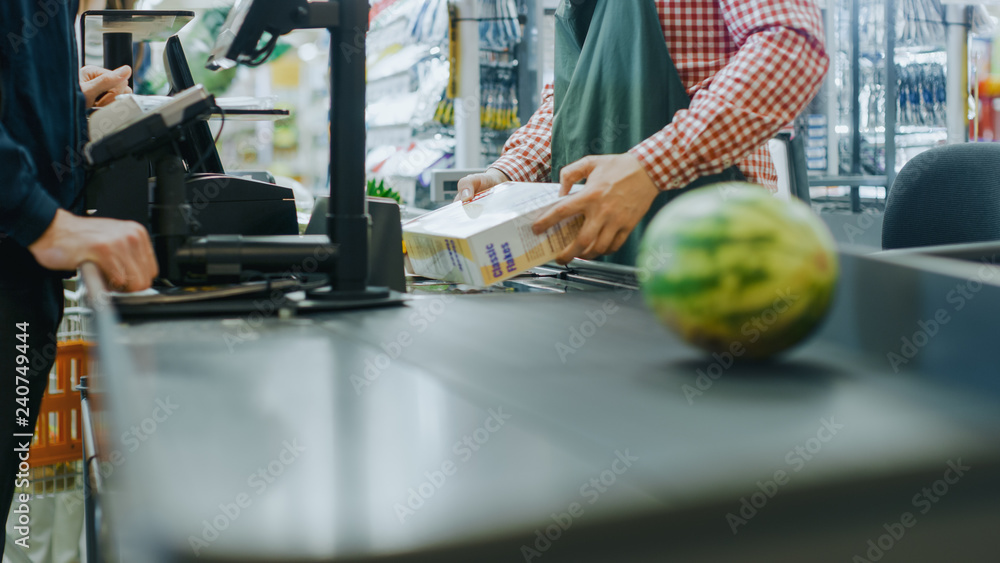

i: 11, img_name: customer-pays-fruit-to-cashier-from-the-supermarket-at-the-cashier-WXWWME.jpg


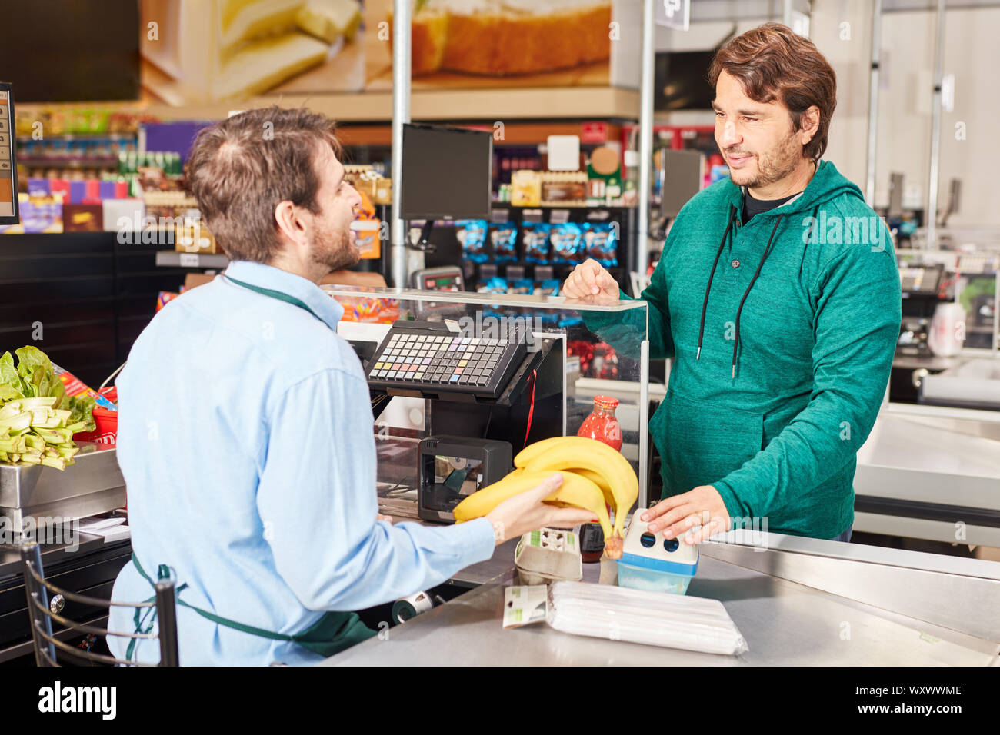

i: 12, img_name: depositphotos_553186560-stock-photo-cashier-in-background-with-multiple.jpg


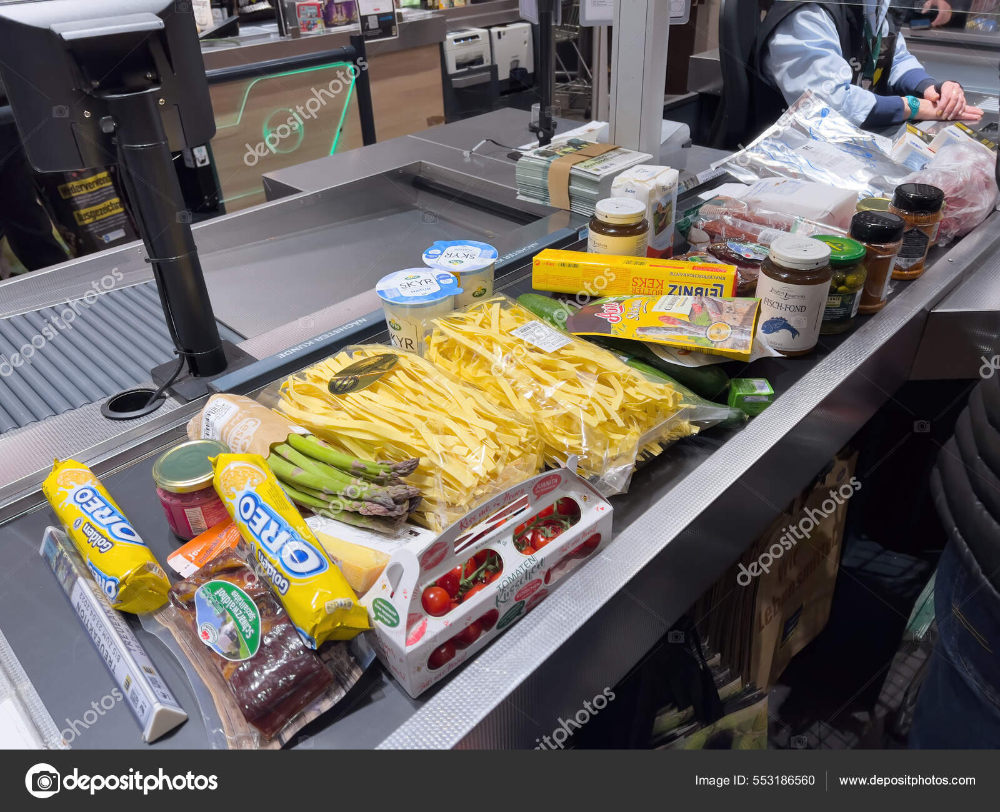

i: 13, img_name: ducts-scanned-by-female-cashier-serving-one-of-buyers-in-supermarket-2JCH4J9.jpg


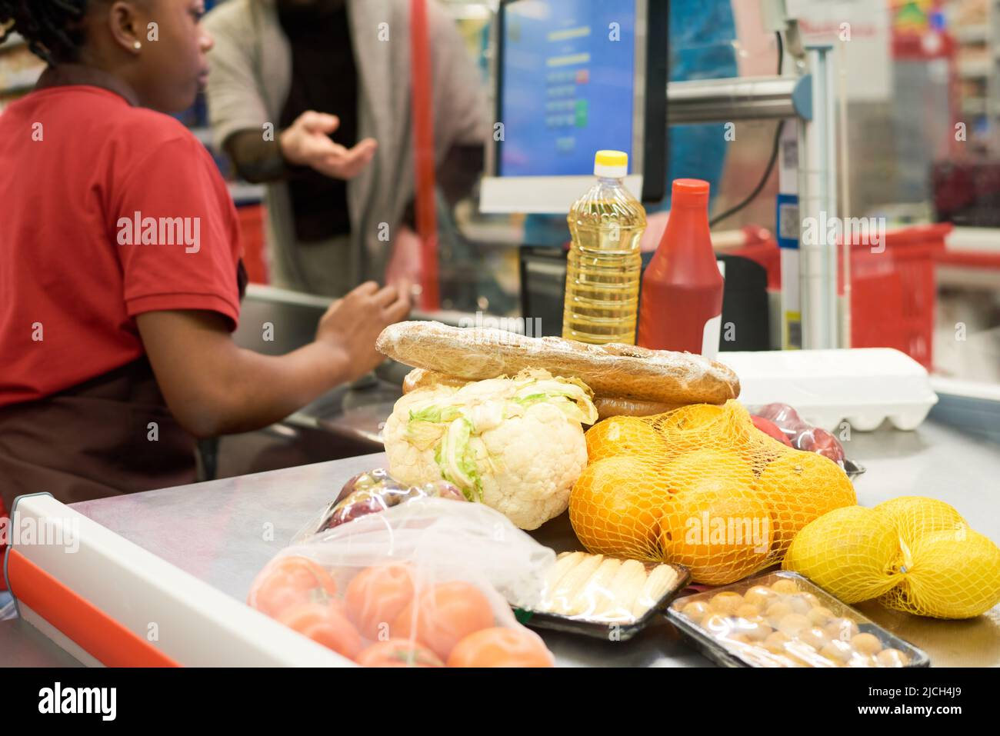

i: 14, img_name: veggies_supermarket.jpg


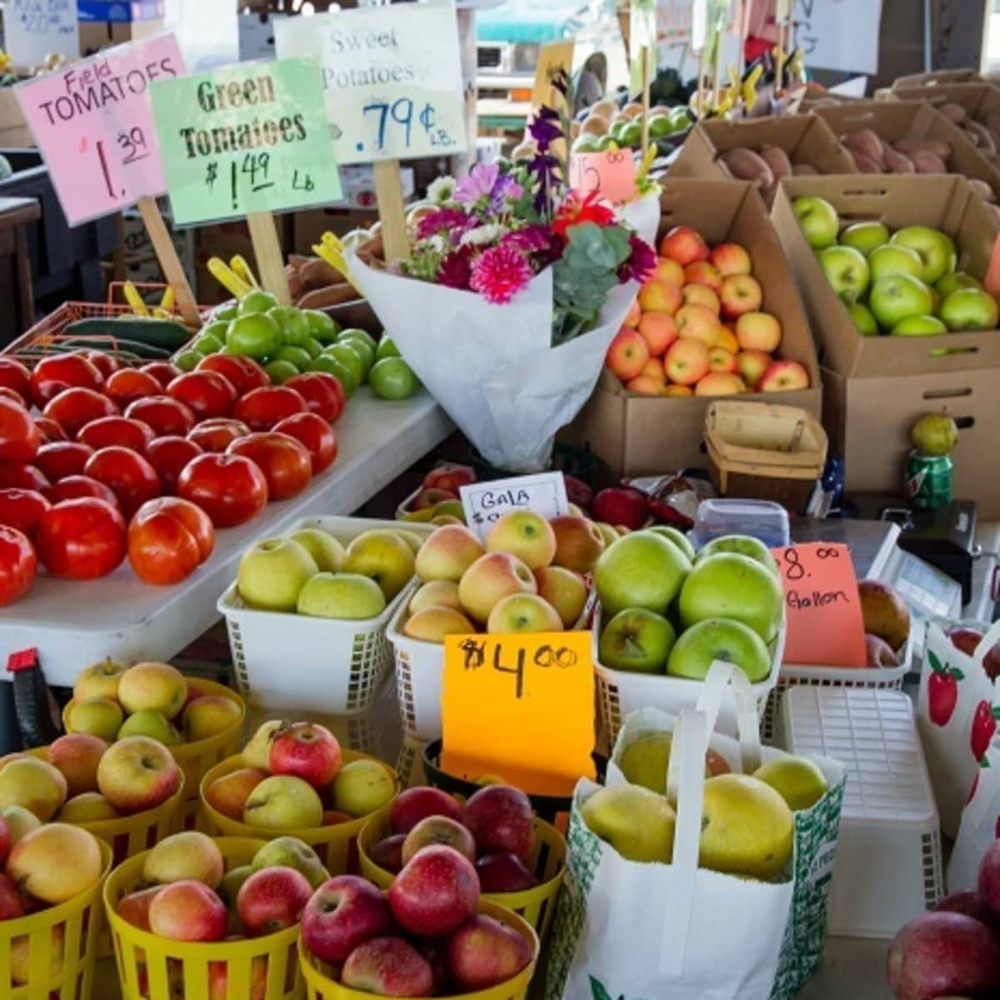

i: 15, img_name: cashier-featured.jpg


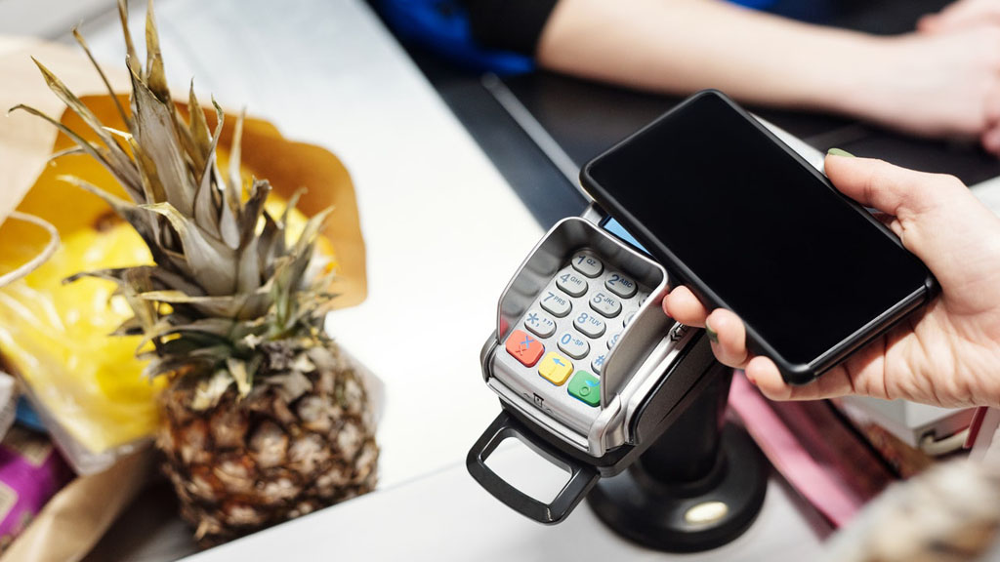

i: 16, img_name: happy-female-cashier-scanning-grocery-items-1.jpg


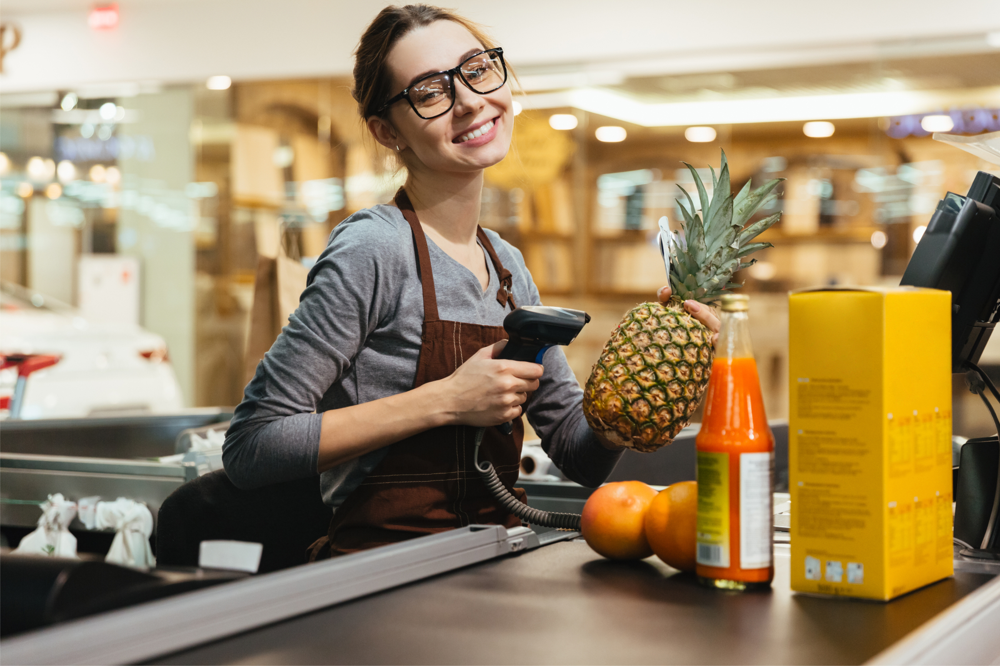

i: 17, img_name: customer-put-vegetable-and-fruits-footage-091831187_prevstill.jpeg


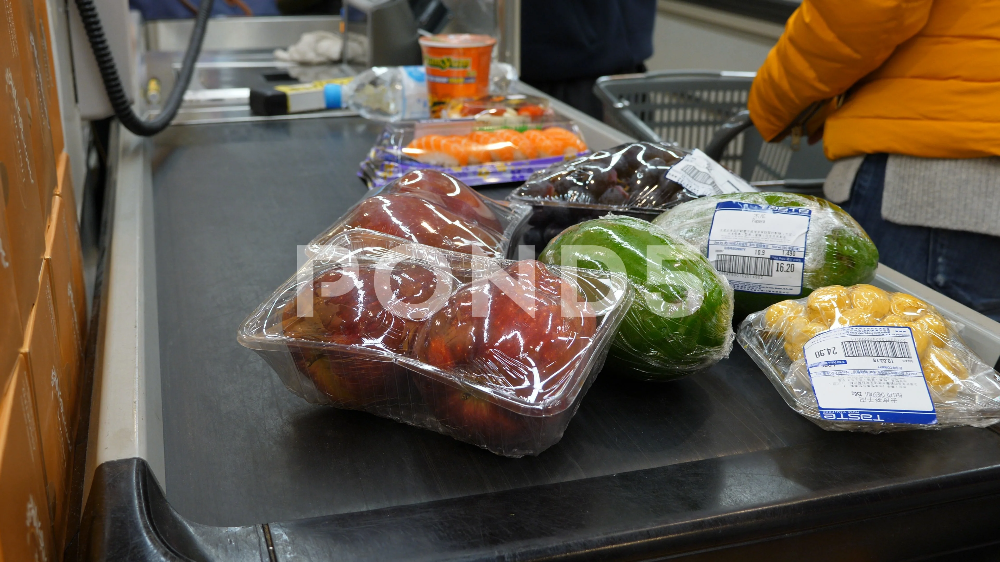

In [24]:
def plot_image(image_path):
  with open(image_path, 'rb') as f:
    np_image_string = np.array([f.read()])
    
  image = Image.open(image_path)
  width, height = image.size
  np_image = np.array(image.getdata()).reshape(height, width, 3).astype(np.uint8)

  display.display(display.Image(image_path, width=500))

for i, img_name in enumerate(os.listdir(root_dir)):
  print('i: {}, img_name: {}'.format(i, img_name))
  plot_image(
      image_path = os.path.join(root_dir, img_name)
  )

Let's see the results for some images.
- With fruits/vegetables that are not in the training dataset
- In different contexts
- Groups of fruits/vegetables 
- single fruit/vegetable

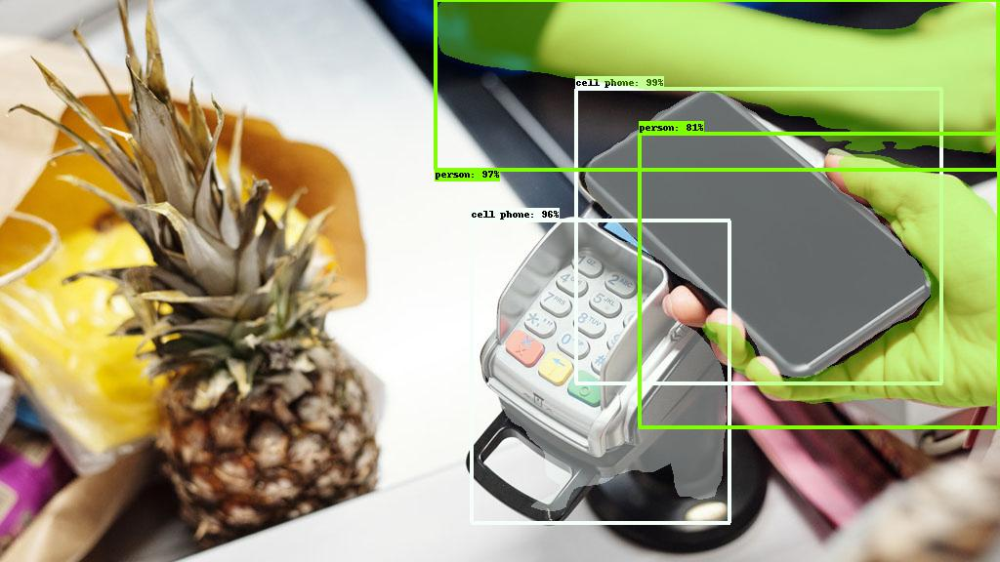

In [25]:
selected_image = os.listdir(root_dir)[15]
image_path = os.path.join(root_dir,
                        selected_image)
detect_objects_in_images(image_path,
                         width_img = 500)

- The pinaple was not detected, as expected, since is not in the training dataset.

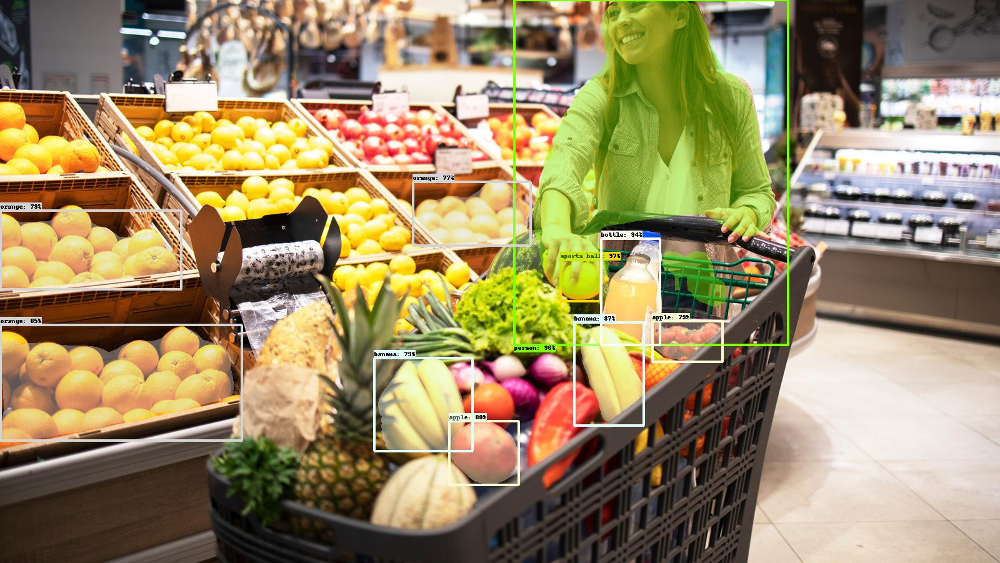

In [26]:
selected_image = os.listdir(root_dir)[2]
image_path = os.path.join(root_dir,
                        selected_image)
detect_objects_in_images(image_path,
                         width_img = 500)

- Bananas were detected.
- groups of oranges were detected.
- strawberries were misclassified as apples.
- other objects were detected: botles, humans, etc.

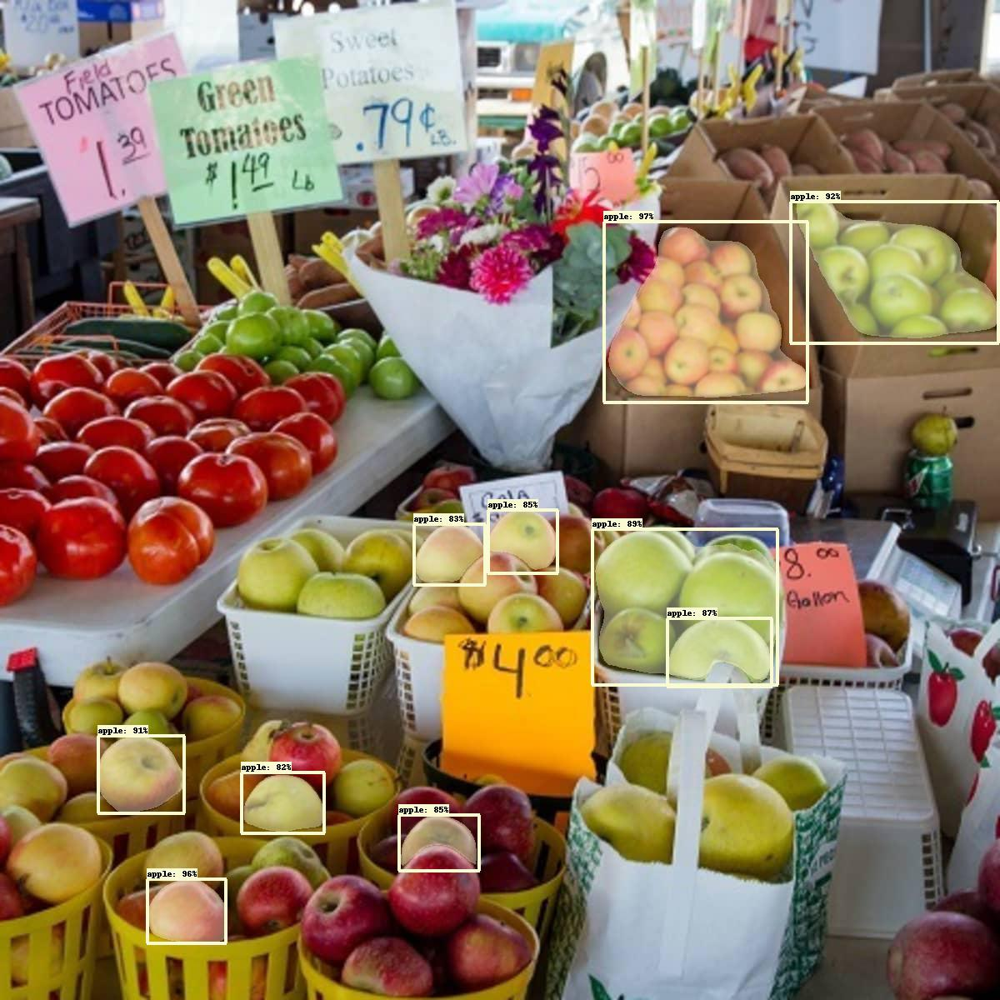

In [27]:
selected_image = os.listdir(root_dir)[14]
image_path = os.path.join(root_dir,
                        selected_image)
detect_objects_in_images(image_path,
                         width_img = 500)

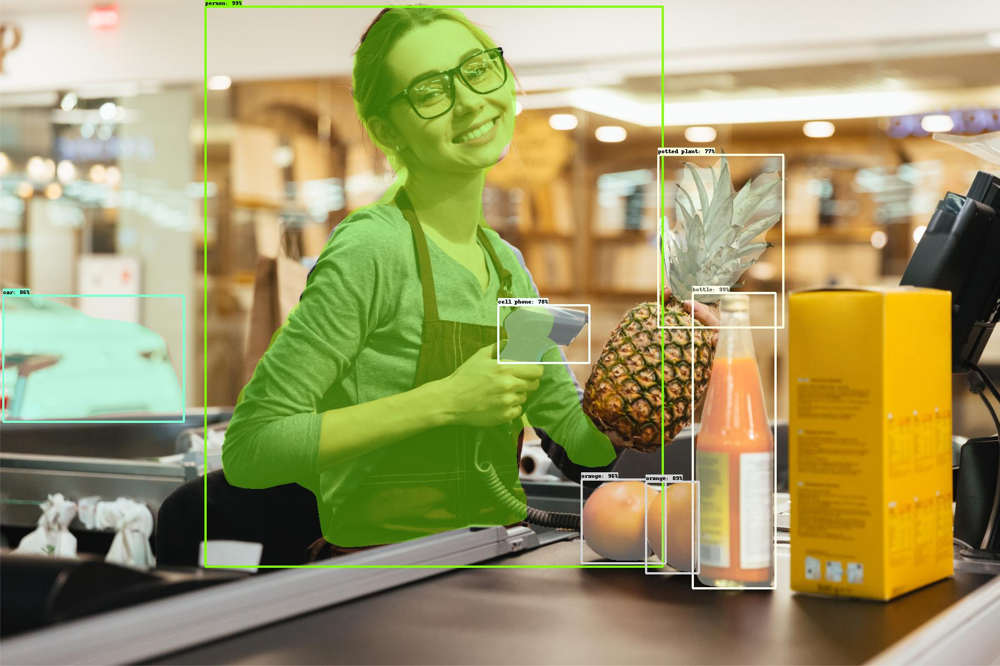

In [28]:
selected_image = os.listdir(root_dir)[16]
image_path = os.path.join(root_dir,
                        selected_image)
detect_objects_in_images(image_path,
                         width_img = 500)

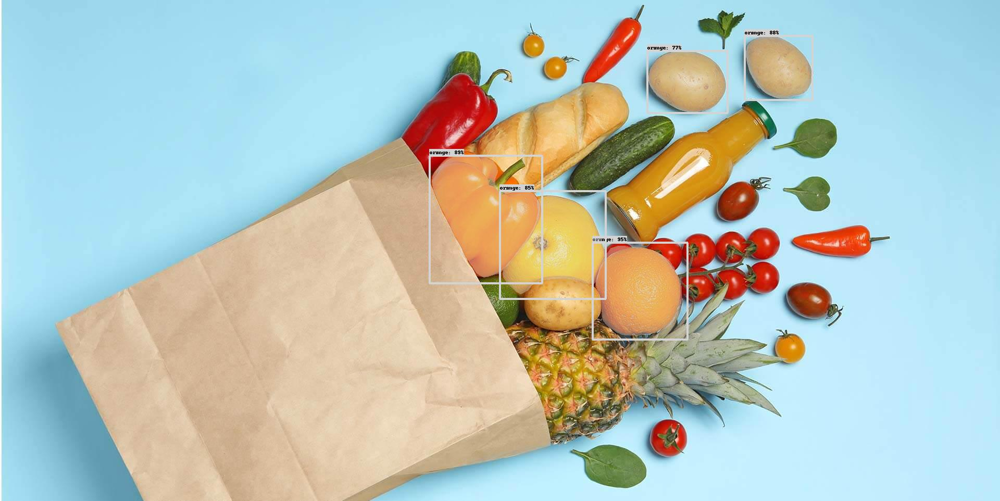

In [29]:
selected_image = os.listdir(root_dir)[9]
image_path = os.path.join(root_dir,
                        selected_image)
detect_objects_in_images(image_path,
                         width_img = 500)

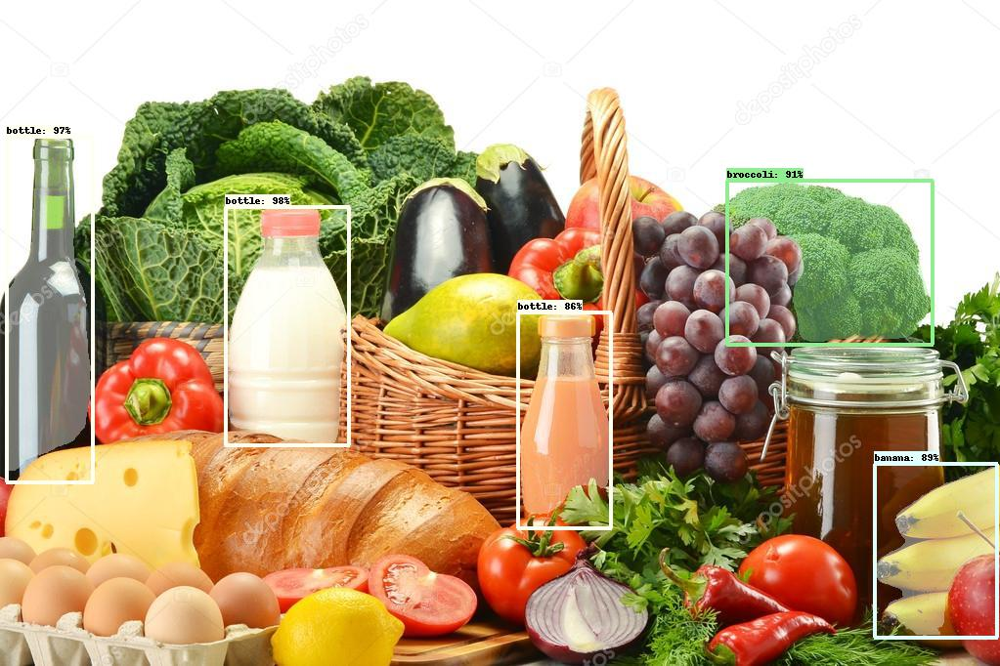

In [30]:
selected_image = os.listdir(root_dir)[6]
image_path = os.path.join(root_dir,
                        selected_image)
detect_objects_in_images(image_path,
                         width_img = 500)

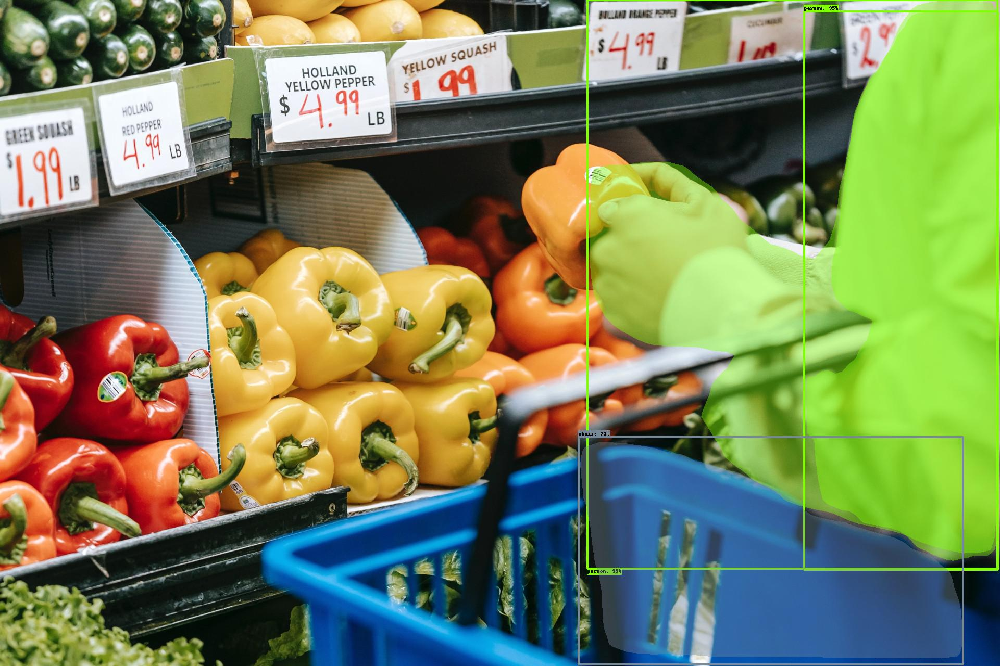

In [31]:
selected_image = os.listdir(root_dir)[1]
image_path = os.path.join(root_dir,
                        selected_image)
detect_objects_in_images(image_path,
                         width_img = 500)

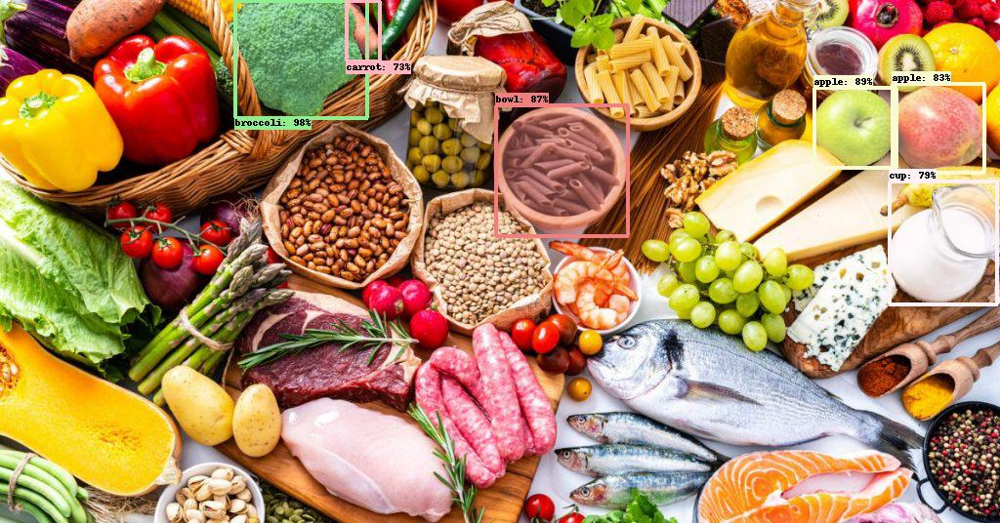

In [32]:
selected_image = os.listdir(root_dir)[7]
image_path = os.path.join(root_dir,
                        selected_image)
detect_objects_in_images(image_path,
                         width_img = 500)

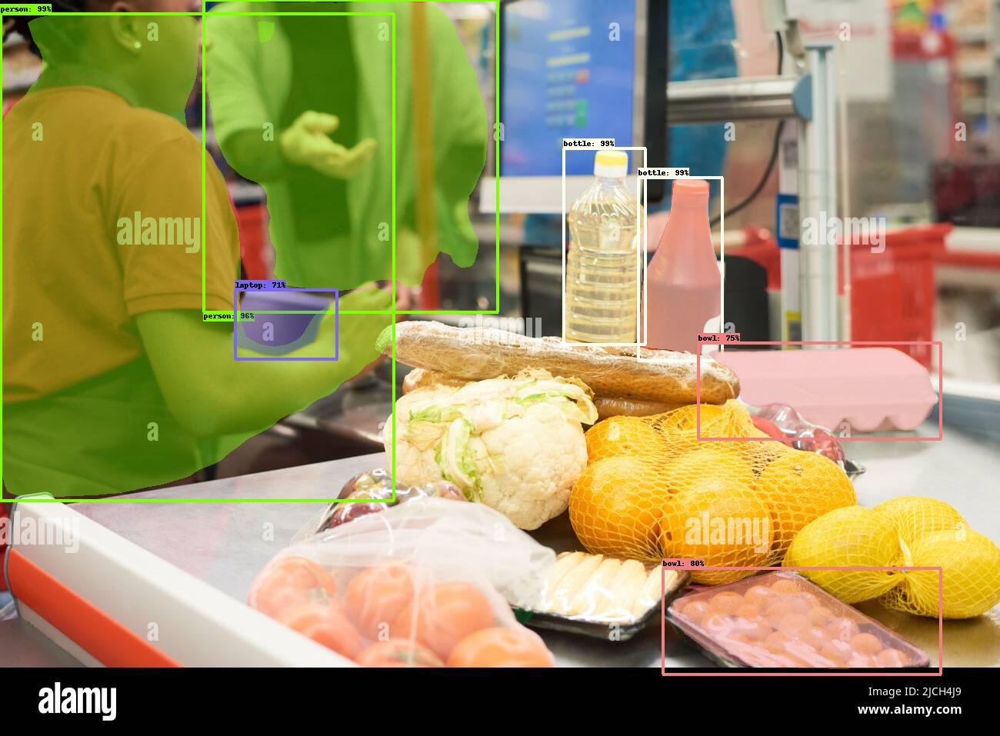

In [33]:
selected_image = os.listdir(root_dir)[13]
image_path = os.path.join(root_dir,
                        selected_image)
detect_objects_in_images(image_path,
                         width_img = 500)

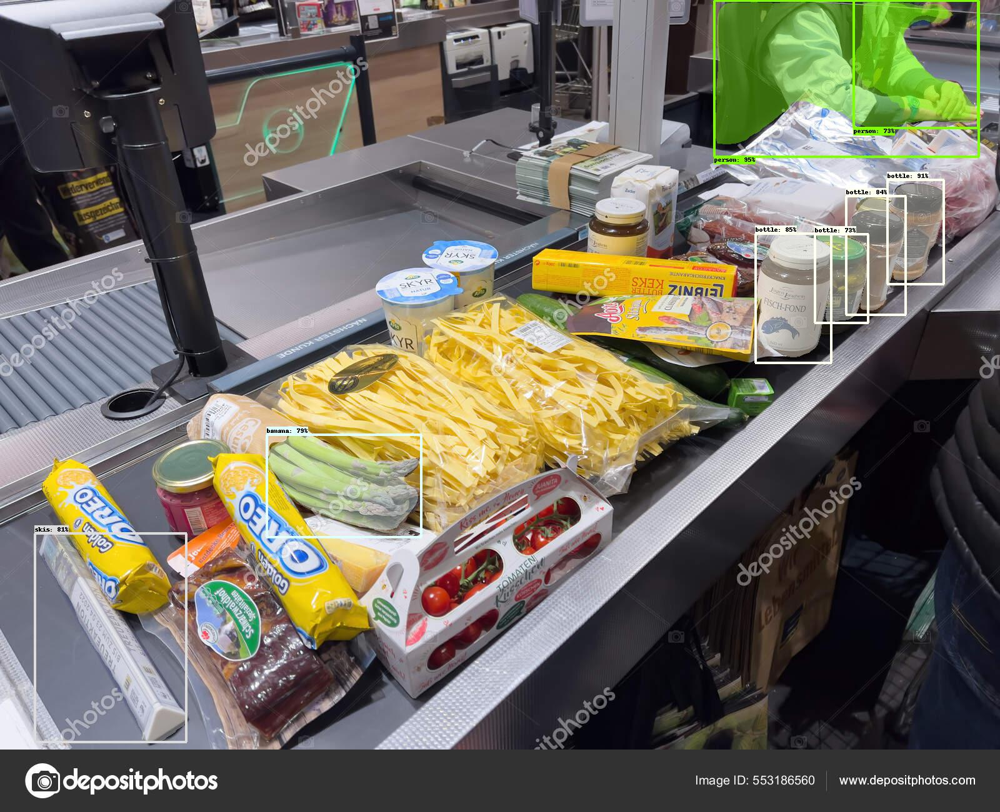

In [34]:
selected_image = os.listdir(root_dir)[12]
image_path = os.path.join(root_dir,
                        selected_image)
detect_objects_in_images(image_path,
                         width_img = 500)

# What's next

* Learn about [Cloud TPUs](https://cloud.google.com/tpu/docs) that Google designed and optimized specifically to speed up and scale up ML workloads for training and inference and to enable ML engineers and researchers to iterate more quickly.
* Explore the range of [Cloud TPU tutorials and Colabs](https://cloud.google.com/tpu/docs/tutorials) to find other examples that can be used when implementing your ML project.
* [Here's](https://cloud.google.com/tpu/docs/tutorials/mask-rcnn) a direct link to the Mask R-CNN tutorial.


## References

- https://github.com/tensorflow/tpu/blob/master/models/official/mask_rcnn/coco_metric.py